<a href="https://colab.research.google.com/github/mrinalini1404/Heart_disease_prediction/blob/main/AI_Proj.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


#**MIT-BIH arrythmia Dataset using normal csv files**
**Exploratory data analysis**

In [ ]:
%matplotlib inline
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib
from sklearn.linear_model import LinearRegression,Ridge,Lasso
from sklearn.preprocessing import PolynomialFeatures
from matplotlib import pyplot as plt
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score,GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score,f1_score
from sklearn import linear_model
from keras import optimizers, losses, activations, models
from keras.callbacks import ModelCheckpoint, EarlyStopping, LearningRateScheduler, ReduceLROnPlateau
from keras.layers import Dense, Input, Dropout, Convolution1D, MaxPool1D, GlobalMaxPool1D, GlobalAveragePooling1D, \
    concatenate
from sklearn.metrics import f1_score, accuracy_score
from keras.models import Sequential
from keras.layers import Dense, Activation
import numpy as np 
import pandas as pd
import os
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score
import tensorflow as tf
from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession

In [ ]:
train_df = pd.read_csv('/content/drive/My Drive/mitbih_train.csv',header=None)
test_df = pd.read_csv('/content/drive/My Drive/mitbih_test.csv',header=None)

In [ ]:
train_df[187]=train_df[187].astype(int)
equilibre=train_df[187].value_counts()
print(equilibre)

0    72471
4     6431
2     5788
1     2223
3      641
Name: 187, dtype: int64


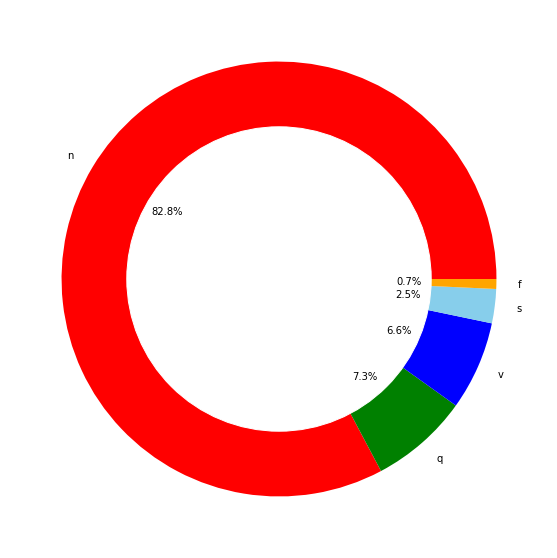

In [ ]:
plt.figure(figsize=(20,10))
my_circle=plt.Circle( (0,0), 0.7, color='white')
plt.pie(equilibre, labels=['n','q','v','s','f'], colors=['red','green','blue','skyblue','orange'],autopct='%1.1f%%')
p=plt.gcf()
p.gca().add_artist(my_circle)
plt.show()

In [ ]:
from sklearn.utils import resample
df_1=train_df[train_df[187]==1]
df_2=train_df[train_df[187]==2]
df_3=train_df[train_df[187]==3]
df_4=train_df[train_df[187]==4]
df_0=(train_df[train_df[187]==0]).sample(n=20000,random_state=42)

df_1_upsample=resample(df_1,replace=True,n_samples=20000,random_state=123)
df_2_upsample=resample(df_2,replace=True,n_samples=20000,random_state=124)
df_3_upsample=resample(df_3,replace=True,n_samples=20000,random_state=125)
df_4_upsample=resample(df_4,replace=True,n_samples=20000,random_state=126)

train_df=pd.concat([df_0,df_1_upsample,df_2_upsample,df_3_upsample,df_4_upsample])

In [ ]:
equilibre=train_df[187].value_counts()
print(equilibre)

4    20000
3    20000
2    20000
1    20000
0    20000
Name: 187, dtype: int64


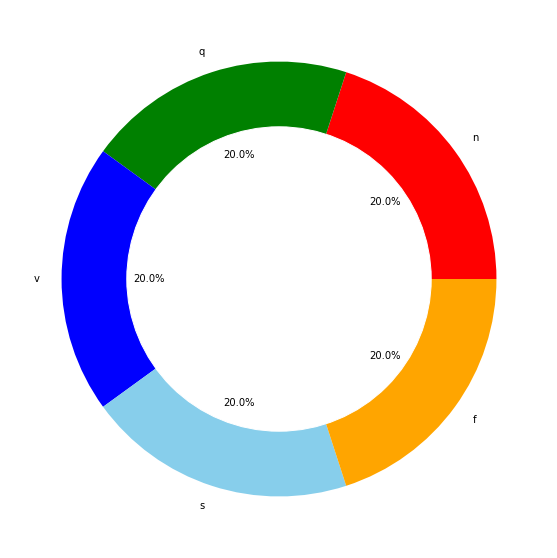

In [ ]:
plt.figure(figsize=(20,10))
my_circle=plt.Circle( (0,0), 0.7, color='white')
plt.pie(equilibre, labels=['n','q','v','s','f'], colors=['red','green','blue','skyblue','orange'],autopct='%1.1f%%')
p=plt.gcf()
p.gca().add_artist(my_circle)
plt.show()

Classes


In [ ]:
c=train_df.groupby(187,group_keys=False).apply(lambda train_df : train_df.sample(1))
c

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187
43743,0.76,0.702222,0.537778,0.293333,0.097778,0.013333,0.008889,0.008889,0.000000,0.026667,0.044444,0.040000,0.017778,0.044444,0.066667,0.062222,0.071111,0.088889,0.093333,0.102222,0.093333,0.124444,0.151111,0.146667,0.137778,0.164444,0.182222,0.186667,0.177778,0.191111,0.213333,0.208889,0.191111,0.204444,0.195556,0.177778,0.155556,0.146667,0.133333,0.124444,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
74642,1.00,0.625749,0.065868,0.113772,0.116766,0.104790,0.107784,0.098802,0.110778,0.098802,0.104790,0.089820,0.101796,0.089820,0.098802,0.095808,0.107784,0.098802,0.110778,0.098802,0.104790,0.092814,0.104790,0.101796,0.110778,0.101796,0.104790,0.095808,0.101796,0.077844,0.083832,0.080838,0.086826,0.092814,0.113772,0.125749,0.161677,0.158683,0.161677,0.155689,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
76328,0.00,0.003067,0.018405,0.033742,0.046012,0.076687,0.119632,0.174847,0.233129,0.328221,0.383436,0.407975,0.447853,0.484663,0.524540,0.610429,0.674847,0.711656,0.723926,0.751534,0.779141,0.797546,0.785276,0.785276,0.794479,0.825153,0.831288,0.855828,0.871166,0.880368,0.871166,0.868098,0.877301,0.911043,0.929448,0.950920,0.941718,0.935583,0.920245,0.938650,...,0.619632,0.628834,0.641104,0.665644,0.625767,0.653374,0.665644,0.644172,0.671779,0.711656,0.699386,0.677914,0.684049,0.714724,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2
80639,1.00,0.817427,0.503458,0.175657,0.059474,0.098202,0.074689,0.045643,0.041494,0.033195,0.026279,0.008299,0.001383,0.005533,0.001383,0.000000,0.001383,0.002766,0.016598,0.022130,0.040111,0.065007,0.087137,0.120332,0.147994,0.178423,0.221300,0.239281,0.265560,0.294606,0.304288,0.315353,0.308437,0.304288,0.301521,0.282158,0.261411,0.258645,0.239281,0.218534,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3
81181,1.00,0.407563,0.407563,0.365546,0.369748,0.340336,0.319328,0.264706,0.226891,0.239496,0.218487,0.134454,0.197479,0.289916,0.298319,0.142857,0.025210,0.000000,0.079832,0.096639,0.147059,0.147059,0.172269,0.168067,0.176471,0.172269,0.180672,0.168067,0.205882,0.176471,0.189076,0.189076,0.201681,0.184874,0.210084,0.193277,0.214286,0.180672,0.205882,0.201681,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4


Normal beat

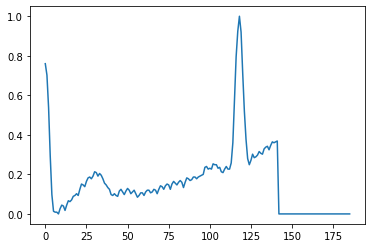

In [ ]:
 plt.plot(c.iloc[0,:186])

1300000
1300000


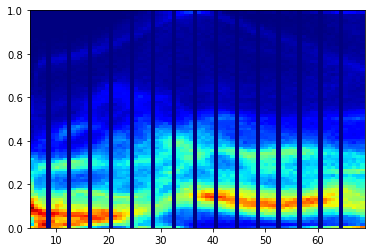

In [ ]:
def plot_hist(class_number,size,min_):
    img=train_df.loc[train_df[187]==class_number].values
    img=img[:,min_:size]
    img_flatten=img.flatten()

    final1=np.arange(min_,size)
    for i in range (img.shape[0]-1):
        tempo1=np.arange(min_,size)
        final1=np.concatenate((final1, tempo1), axis=None)
    print(len(final1))
    print(len(img_flatten))
    plt.hist2d(final1,img_flatten, bins=(80,80),cmap=plt.cm.jet)
    plt.show()
plot_hist(0,70,5)

Class 1

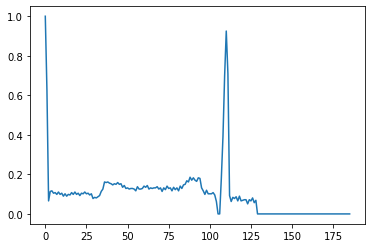

In [ ]:
plt.plot(c.iloc[1,:186])

900000
900000


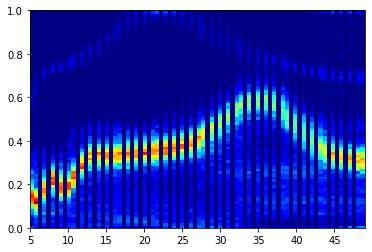

In [ ]:
plot_hist(1,50,5)

Class 2

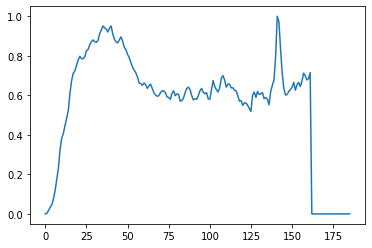

In [ ]:
plt.plot(c.iloc[2,:186])

600000
600000


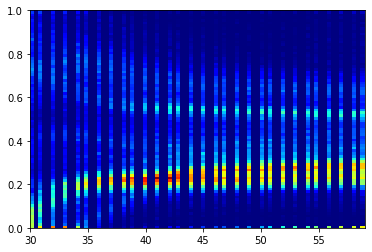

In [ ]:
plot_hist(2,60,30)

Class 3

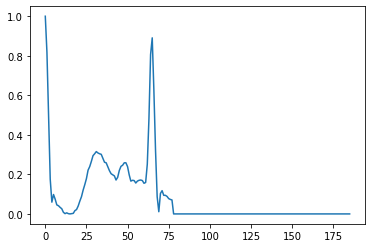

In [ ]:
plt.plot(c.iloc[3,:186])

700000
700000


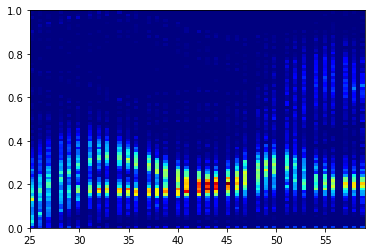

In [ ]:
plot_hist(3,60,25)

Class 4

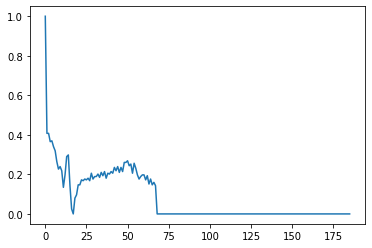

In [ ]:
plt.plot(c.iloc[4,:186])

640000
640000


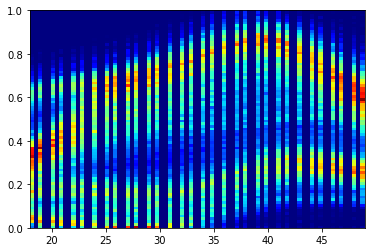

In [ ]:
plot_hist(4,50,18)

In [ ]:
Y = np.array(train_df[187].values).astype(np.int8)
X = np.array(train_df[list(range(187))].values)[..., np.newaxis]

Y_test = np.array(test_df[187].values).astype(np.int8)
X_test = np.array(test_df[list(range(187))].values)[..., np.newaxis]


In [ ]:
df = pd.concat([train_df, test_df], axis=0)
M=df.values
X = M[:, :-1]
y = M[:, -1].astype(int)


In [ ]:
C0 = np.argwhere(y == 0).flatten()
C1 = np.argwhere(y == 1).flatten()
C2 = np.argwhere(y == 2).flatten()
C3 = np.argwhere(y == 3).flatten()
C4 = np.argwhere(y == 4).flatten()

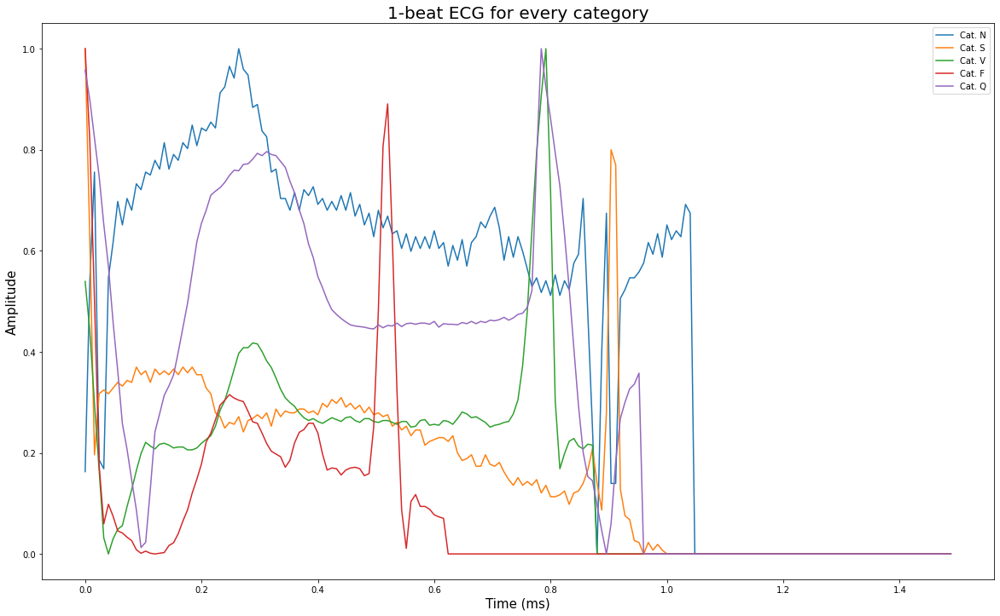

In [ ]:
x = np.arange(0, 187)*8/1000

plt.figure(figsize=(20,12))
plt.plot(x, X[C0, :][0], label="Cat. N")
plt.plot(x, X[C1, :][0], label="Cat. S")
plt.plot(x, X[C2, :][0], label="Cat. V")
plt.plot(x, X[C3, :][0], label="Cat. F")
plt.plot(x, X[C4, :][0], label="Cat. Q")
plt.legend()
plt.title("1-beat ECG for every category", fontsize=20)
plt.ylabel("Amplitude", fontsize=15)
plt.xlabel("Time (ms)", fontsize=15)
plt.show()

# **Extracting features**
## Using scipy.signal


In [ ]:
from scipy.signal import find_peaks,peak_widths,peak_prominences,argrelmin,argrelmax,argrelextrema,spectrogram
from sklearn.model_selection import train_test_split

In [ ]:
x_train=train_df.iloc[:,0:187]
y_train=train_df.iloc[:,187] 

In [ ]:
pk=find_peaks(x_train.iloc[0,:])
print(pk)

(array([  2,   7,   9,  11,  13,  15,  17,  19,  21,  23,  25,  27,  31,
        33,  37,  41,  45,  47,  49,  51,  53,  55,  57,  59,  61,  63,
        65,  67,  69,  71,  73,  75,  77,  79,  81,  85,  88,  91,  93,
        97,  99, 101, 103, 107, 112, 121, 123, 125, 127, 129]), {})


In [ ]:
peaks=[]
height=[]
width=[]
prominance=[]
arg_min=[]
arg_max=[]
for i in range(len(x_train)):
    peak,hei=find_peaks(x_train.iloc[i,:],height=0)
    peaks.append(peak)
    height.append(hei['peak_heights'])
    wid=peak_widths(x_train.iloc[i,:],peak)[0]
    width.append(wid)
    pro=peak_prominences(x_train.iloc[i,:],peak)[0]
    prominance.append(pro)
    amin=argrelmin(np.array(x_train.iloc[i,:]))[0]
    arg_min.append(amin)
    amax=argrelmax(np.array(x_train.iloc[i,:]))[0]
    arg_max.append(amax)

In [ ]:
f1_len=max([len(i) for i in peaks])
f2_len=max([len(i) for i in height])
f3_len=max([len(i) for i in width])
f4_len=max([len(i) for i in prominance])
f5_len=max([len(i) for i in arg_min])
f6_len=max([len(i) for i in arg_max])

In [ ]:
F1_peaks=[]
F2_height=[]
F3_width=[]
F4_prominance=[]
F5_argmin=[]
F6_argmax=[]
for i in range(len(peaks)):
    pa1=np.pad(peaks[i],(0,f1_len-len(peaks[i])),'constant')
    F1_peaks.append(pa1)
    pa2=np.pad(height[i],(0,f2_len-len(height[i])),'constant')
    F2_height.append(pa2)
    pa3=np.pad(width[i],(0,f3_len-len(width[i])),'constant')
    F3_width.append(pa3)
    pa4=np.pad(prominance[i],(0,f4_len-len(prominance[i])),'constant')
    F4_prominance.append(pa4)
    pa5=np.pad(arg_min[i],(0,f5_len-len(arg_min[i])),'constant')
    F5_argmin.append(pa5)
    pa6=np.pad(arg_max[i],(0,f6_len-len(arg_max[i])),'constant')
    F6_argmax.append(pa6)

In [ ]:
ecg_feat=np.concatenate((F1_peaks,F2_height,F3_width,F4_prominance,F5_argmin,F6_argmax),axis=1)

In [ ]:
[xtrain,xtest,ytrain,ytest]=train_test_split(ecg_feat,y_train,test_size=0.2,random_state=48)

In [ ]:
from sklearn.ensemble import RandomForestClassifier
ecg_mod=RandomForestClassifier()
ecg_mod.fit(xtrain,ytrain)
ypred=ecg_mod.predict(xtest)

In [ ]:
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
acc=accuracy_score(ytest,ypred)
print("Accuracy of the model is",acc*100)
cm=confusion_matrix(ytest,ypred)
print(cm)

Accuracy of the model is 99.21
[[3894   24   59    6   10]
 [   0 4049    0    0    0]
 [  23    0 3934    1    5]
 [   0    0    0 4017    0]
 [  18    0   12    0 3948]]


## Calculate difference between t(unit time) with t+1



In [ ]:
train_df = pd.read_csv('/content/drive/My Drive/mitbih_train.csv',header=None)
test_df = pd.read_csv('/content/drive/My Drive/mitbih_test.csv',header=None)

In [ ]:
train_df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187
0,0.977941,0.926471,0.681373,0.245098,0.154412,0.191176,0.151961,0.085784,0.058824,0.049020,0.044118,0.061275,0.066176,0.061275,0.049020,0.073529,0.061275,0.061275,0.066176,0.068627,0.095588,0.075980,0.093137,0.105392,0.115196,0.102941,0.117647,0.125000,0.142157,0.127451,0.151961,0.144608,0.164216,0.144608,0.159314,0.151961,0.154412,0.142157,0.151961,0.151961,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.960114,0.863248,0.461538,0.196581,0.094017,0.125356,0.099715,0.088319,0.074074,0.082621,0.074074,0.062678,0.065527,0.065527,0.062678,0.076923,0.071225,0.082621,0.091168,0.096866,0.082621,0.082621,0.091168,0.105413,0.122507,0.148148,0.182336,0.193732,0.213675,0.207977,0.222222,0.253561,0.270655,0.287749,0.284900,0.293447,0.256410,0.247863,0.188034,0.145299,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.000000,0.659459,0.186486,0.070270,0.070270,0.059459,0.056757,0.043243,0.054054,0.045946,0.056757,0.043243,0.067568,0.062162,0.078378,0.072973,0.086486,0.081081,0.108108,0.110811,0.135135,0.135135,0.170270,0.183784,0.216216,0.237838,0.270270,0.286486,0.316216,0.318919,0.332432,0.297297,0.267568,0.216216,0.189189,0.132432,0.118919,0.064865,0.064865,0.043243,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.925414,0.665746,0.541436,0.276243,0.196133,0.077348,0.071823,0.060773,0.066298,0.058011,0.063536,0.082873,0.085635,0.093923,0.113260,0.124309,0.140884,0.132597,0.140884,0.091160,0.085635,0.074586,0.071823,0.080110,0.096685,0.118785,0.138122,0.140884,0.138122,0.146409,0.110497,0.102210,0.060773,0.027624,0.038674,0.013812,0.011050,0.013812,0.033149,0.005525,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.967136,1.000000,0.830986,0.586854,0.356808,0.248826,0.145540,0.089202,0.117371,0.150235,0.131455,0.122066,0.140845,0.159624,0.150235,0.145540,0.136150,0.169014,0.178404,0.173709,0.183099,0.201878,0.187793,0.164319,0.187793,0.215962,0.215962,0.201878,0.211268,0.230047,0.215962,0.230047,0.239437,0.267606,0.253521,0.230047,0.220657,0.225352,0.211268,0.173709,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
test_df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187
0,1.000000,0.758264,0.111570,0.000000,0.080579,0.078512,0.066116,0.049587,0.047521,0.035124,0.030992,0.028926,0.035124,0.026860,0.039256,0.035124,0.043388,0.047521,0.053719,0.053719,0.070248,0.072314,0.084711,0.097107,0.121901,0.132231,0.169421,0.196281,0.214876,0.235537,0.254132,0.264463,0.285124,0.272727,0.266529,0.239669,0.214876,0.173554,0.157025,0.123967,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.908425,0.783883,0.531136,0.362637,0.366300,0.344322,0.333333,0.307692,0.296703,0.300366,0.304029,0.336996,0.377289,0.391941,0.439560,0.446886,0.457875,0.479853,0.512821,0.534799,0.586081,0.586081,0.604396,0.633700,0.615385,0.582418,0.564103,0.520147,0.490842,0.490842,0.468864,0.454212,0.450549,0.465201,0.450549,0.432234,0.424908,0.410256,0.391941,0.369963,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.730088,0.212389,0.000000,0.119469,0.101770,0.101770,0.110619,0.123894,0.115044,0.132743,0.106195,0.141593,0.128319,0.150442,0.132743,0.150442,0.132743,0.150442,0.123894,0.163717,0.137168,0.141593,0.132743,0.150442,0.128319,0.146018,0.119469,0.123894,0.101770,0.092920,0.070796,0.079646,0.066372,0.070796,0.079646,0.092920,0.088496,0.084071,0.079646,0.088496,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1.000000,0.910417,0.681250,0.472917,0.229167,0.068750,0.000000,0.004167,0.014583,0.054167,0.102083,0.122917,0.150000,0.168750,0.172917,0.170833,0.168750,0.164583,0.156250,0.152083,0.147917,0.147917,0.145833,0.145833,0.141667,0.141667,0.147917,0.158333,0.168750,0.179167,0.191667,0.206250,0.220833,0.239583,0.258333,0.275000,0.287500,0.308333,0.320833,0.331250,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.570470,0.399329,0.238255,0.147651,0.000000,0.003356,0.040268,0.080537,0.070470,0.090604,0.080537,0.104027,0.093960,0.117450,0.097315,0.134228,0.124161,0.161074,0.171141,0.194631,0.204698,0.261745,0.275168,0.332215,0.345638,0.395973,0.406040,0.456376,0.446309,0.446309,0.399329,0.369128,0.308725,0.295302,0.265101,0.271812,0.258389,0.268456,0.261745,0.281879,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
train_x = np.array(train_df[train_df.columns[0:-1]], dtype=np.float32)
train_y = np.array(train_df[train_df.columns[-1:]], dtype=np.float32)

test_x = np.array(train_df[test_df.columns[0:-1]], dtype=np.float32)
test_y = np.array(train_df[test_df.columns[-1:]], dtype=np.float32)

In [ ]:
def return_diff_array_table(array, dur):
  for idx in range(array.shape[1]-dur):
    before_col = array[:,idx]
    after_col = array[:,idx+dur]
    new_col = ((after_col - before_col)+1)/2
    new_col = new_col.reshape(-1,1)
    if idx == 0:
      new_table = new_col
    else :
      new_table = np.concatenate((new_table, new_col), axis=1)
#For concat add zero padding
  padding_array = np.zeros(shape=(array.shape[0],dur))
  new_table = np.concatenate((padding_array, new_table), axis=1)
  return new_table
#Concat
def return_merge_diff_table(df, diff_dur):
  fin_table = df.reshape(-1,187,1,1)
  for dur in diff_dur:
    temp_table = return_diff_array_table(df, dur)
    fin_table = np.concatenate((fin_table, temp_table.reshape(-1,187,1,1)), axis=2)
  return fin_table

#Use "stratify" option
x_train, x_val, y_train, y_val = train_test_split(train_x, train_y, test_size=0.2, stratify=train_y)

#Add Data
x_train = return_merge_diff_table(df=x_train, diff_dur=[1])
x_val = return_merge_diff_table(df=x_val, diff_dur=[1])

print(x_train.shape, y_train.shape, x_val.shape, y_val.shape)

(70043, 187, 2, 1) (70043, 1) (17511, 187, 2, 1) (17511, 1)


In [ ]:
def return_result(model, x_train, x_test, y_train, y_test):
    y_pred = model.predict(x_test)
    train_pred = model.predict(x_train)
    pred_list=[]
    for x in y_pred:
        pred_list.append(np.argmax(x))
    train_pred_list=[]
    for x in train_pred:
        train_pred_list.append(np.argmax(x))
    test_mat = confusion_matrix(y_test, pred_list)
    train_mat = confusion_matrix(y_train, train_pred_list)
    print("In train")
    print(accuracy_score(y_train, train_pred_list))
    print(train_mat)
    print("In test")
    print(accuracy_score(y_test, pred_list))
    print(test_mat)

In [ ]:
def return_model1():
    input_tens = tf.keras.Input(shape=(187,2,1))
    x = tf.keras.layers.Conv2D(256, kernel_size=(10,2), strides=(5,1),padding='valid')(input_tens)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.Dropout(rate=0.5)(x)
    x = tf.keras.layers.Conv2D(512, kernel_size=(5,1), padding='valid')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.Dropout(rate=0.5)(x)
    x = tf.keras.layers.Conv2D(512, kernel_size=(5,1), padding='valid')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.Dropout(rate=0.5)(x)
    x = tf.keras.layers.Conv2D(128, kernel_size=(5,1), padding='valid')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.Dropout(rate=0.5)(x)
    x = tf.keras.layers.Conv2D(64, kernel_size=(5,1), padding='valid')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.GlobalAveragePooling2D()(x)
    x = tf.keras.layers.Dense(5, activation="softmax")(x)
    model = tf.keras.Model(inputs=input_tens, outputs=x)
    model.compile(optimizer=tf.keras.optimizers.Adam(), loss=tf.keras.losses.SparseCategoricalCrossentropy(), metrics=["accuracy"])
    print(model.summary())
    return model

In [ ]:
model1 = return_model1()

Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 187, 2, 1)]       0         
_________________________________________________________________
conv2d (Conv2D)              (None, 36, 1, 256)        5376      
_________________________________________________________________
batch_normalization (BatchNo (None, 36, 1, 256)        1024      
_________________________________________________________________
re_lu (ReLU)                 (None, 36, 1, 256)        0         
_________________________________________________________________
dropout (Dropout)            (None, 36, 1, 256)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 32, 1, 512)        655872    
_________________________________________________________________
batch_normalization_1 (Batch (None, 32, 1, 512)       

In [ ]:
checkpoint_path_best = "./best_acc_v01.ckpt"
cp_callback_best = tf.keras.callbacks.ModelCheckpoint(checkpoint_path_best,monitor="val_accuracy",save_weights_only=True,verbose=1,save_best_only=True)

model1.fit(x_train,y_train, epochs=200, batch_size=128, validation_data=(x_val,y_val),callbacks=[cp_callback_best])


Epoch 1/200
548/548 [==============================] - ETA: 0s - loss: 0.3668 - accuracy: 0.8948
Epoch 00001: val_accuracy improved from -inf to 0.61167, saving model to ./best_acc_v01.ckpt
548/548 [==============================] - 9s 16ms/step - loss: 0.3668 - accuracy: 0.8948 - val_loss: 0.9480 - val_accuracy: 0.6117
Epoch 2/200
545/548 [============================>.] - ETA: 0s - loss: 0.1950 - accuracy: 0.9450
Epoch 00002: val_accuracy improved from 0.61167 to 0.93907, saving model to ./best_acc_v01.ckpt
548/548 [==============================] - 9s 16ms/step - loss: 0.1950 - accuracy: 0.9449 - val_loss: 0.2143 - val_accuracy: 0.9391
Epoch 3/200
545/548 [============================>.] - ETA: 0s - loss: 0.1509 - accuracy: 0.9585
Epoch 00003: val_accuracy improved from 0.93907 to 0.96277, saving model to ./best_acc_v01.ckpt
548/548 [==============================] - 9s 16ms/step - loss: 0.1507 - accuracy: 0.9585 - val_loss: 0.1465 - val_accuracy: 0.9628
Epoch 4/200
545/548 [=======

In [ ]:
return_result(model1, x_train=x_train, x_test=x_val, y_train=y_train, y_test=y_val)

In train
0.9987293519695044
[[57940    31     0     6     0]
 [    6  1772     0     0     0]
 [    0     0  4616    14     0]
 [   26     0     5   482     0]
 [    1     0     0     0  5144]]
In test
0.9903489235337788
[[14451    29     4     3     7]
 [   47   397     1     0     0]
 [   27     7  1113    11     0]
 [   21     1     8    98     0]
 [    2     1     0     0  1283]]


# **Using Keras**

In [ ]:
from keras.utils import to_categorical

print("--- X ---")
X = train_df.loc[:, train_df.columns != 187]
print(X.head())
print(X.info())

print("--- Y ---")
y = train_df.loc[:, train_df.columns == 187]
y = to_categorical(y)

print("--- testX ---")
testX = test_df.loc[:, test_df.columns != 187]
print(testX.head())
print(testX.info())

print("--- testy ---")
testy = test_df.loc[:, test_df.columns == 187]
testy = to_categorical(testy)

model = Sequential()

model.add(Dense(50, activation='relu', input_shape=(187,)))
model.add(Dense(50, activation='relu'))
model.add(Dense(5, activation='softmax'))

model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

model.fit(X, y, epochs=100)

print("Evaluation: ")
mse, acc = model.evaluate(testX, testy)
print('mean_squared_error :', mse)
print('accuracy:', acc)

--- X ---
        0         1         2         3         4    ...  182  183  184  185  186
0  0.977941  0.926471  0.681373  0.245098  0.154412  ...  0.0  0.0  0.0  0.0  0.0
1  0.960114  0.863248  0.461538  0.196581  0.094017  ...  0.0  0.0  0.0  0.0  0.0
2  1.000000  0.659459  0.186486  0.070270  0.070270  ...  0.0  0.0  0.0  0.0  0.0
3  0.925414  0.665746  0.541436  0.276243  0.196133  ...  0.0  0.0  0.0  0.0  0.0
4  0.967136  1.000000  0.830986  0.586854  0.356808  ...  0.0  0.0  0.0  0.0  0.0

[5 rows x 187 columns]
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 87554 entries, 0 to 87553
Columns: 187 entries, 0 to 186
dtypes: float64(187)
memory usage: 124.9 MB
None
--- Y ---
--- testX ---
        0         1         2         3         4    ...  182  183  184  185  186
0  1.000000  0.758264  0.111570  0.000000  0.080579  ...  0.0  0.0  0.0  0.0  0.0
1  0.908425  0.783883  0.531136  0.362637  0.366300  ...  0.0  0.0  0.0  0.0  0.0
2  0.730088  0.212389  0.000000  0.119469  0.101

In [ ]:
Y = np.array(train_df[187].values).astype(np.int8)
X = np.array(train_df[list(range(187))].values)[..., np.newaxis]

Y_test = np.array(test_df[187].values).astype(np.int8)
X_test = np.array(test_df[list(range(187))].values)[..., np.newaxis]

def get_model():
    nclass = 5
    inp = Input(shape=(187, 1))
    img_1 = Convolution1D(16, kernel_size=5, activation=activations.relu, padding="valid")(inp)
    img_1 = Convolution1D(16, kernel_size=5, activation=activations.relu, padding="valid")(img_1)
    img_1 = MaxPool1D(pool_size=2)(img_1)
    img_1 = Dropout(rate=0.1)(img_1)
    img_1 = Convolution1D(32, kernel_size=3, activation=activations.relu, padding="valid")(img_1)
    img_1 = Convolution1D(32, kernel_size=3, activation=activations.relu, padding="valid")(img_1)
    img_1 = MaxPool1D(pool_size=2)(img_1)
    img_1 = Dropout(rate=0.1)(img_1)
    img_1 = Convolution1D(32, kernel_size=3, activation=activations.relu, padding="valid")(img_1)
    img_1 = Convolution1D(32, kernel_size=3, activation=activations.relu, padding="valid")(img_1)
    img_1 = MaxPool1D(pool_size=2)(img_1)
    img_1 = Dropout(rate=0.1)(img_1)
    img_1 = Convolution1D(256, kernel_size=3, activation=activations.relu, padding="valid")(img_1)
    img_1 = Convolution1D(256, kernel_size=3, activation=activations.relu, padding="valid")(img_1)
    img_1 = GlobalMaxPool1D()(img_1)
    img_1 = Dropout(rate=0.2)(img_1)

    dense_1 = Dense(64, activation=activations.relu, name="dense_1")(img_1)
    dense_1 = Dense(64, activation=activations.relu, name="dense_2")(dense_1)
    dense_1 = Dense(nclass, activation=activations.softmax, name="dense_3_mitbih")(dense_1)

    model = models.Model(inputs=inp, outputs=dense_1)
    opt = optimizers.Adam(0.001)

    model.compile(optimizer=opt, loss=losses.sparse_categorical_crossentropy, metrics=['acc'])
    model.summary()
    return model


In [ ]:
model = get_model()
file_path = "baseline_cnn_mitbih.h5"
checkpoint = ModelCheckpoint(file_path, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
early = EarlyStopping(monitor="val_acc", mode="max", patience=5, verbose=1)
redonplat = ReduceLROnPlateau(monitor="val_acc", mode="max", patience=3, verbose=2)
callbacks_list = [checkpoint, early, redonplat]  # early

model.fit(X, Y, epochs=1000, verbose=2, callbacks=callbacks_list, validation_split=0.1)
model.load_weights(file_path)

pred_test = model.predict(X_test)
pred_test = np.argmax(pred_test, axis=-1)

f1 = f1_score(Y_test, pred_test, average="macro")

print("Test f1 score : %s "% f1)

acc = accuracy_score(Y_test, pred_test)

# **wfdb processing signals directly**

In [ ]:
!pip install wfdb

     |████████████████████████████████| 122kB 4.7MB/s 
     |████████████████████████████████| 6.8MB 13.9MB/s 
     |████████████████████████████████| 163kB 53.6MB/s 
  Created wheel for wfdb: filename=wfdb-3.1.1-cp36-none-any.whl size=117828 sha256=3c5fa5d14b72797726082a73d9d90941bcede2a7fa49bfdf26ef59e6e98f35ce
  Stored in directory: /root/.cache/pip/wheels/bc/d0/c1/90538d266ccba2d1076fbc9970192c7ea1a09c99df3e65c69b
Successfully built wfdb


In [ ]:
import wfdb
import torch
import torch.nn as nn

import wfdb
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline


In [ ]:
ecg_record = wfdb.rdrecord('/content/drive/My Drive/mitdb/100', channels= [0])
ecg_record.fs

360

In [ ]:
ecg_record = wfdb.rdrecord('/content/drive/My Drive/mitdb/100', sampfrom= 0, sampto= 108300, channels= [0])

In [ ]:
ecg = ecg_record.p_signal[:,0]
train_len = 108000

ecg_train = ecg[0: train_len]
ecg_test = ecg[train_len:]

In [ ]:
ecg_train = torch.FloatTensor(ecg_train).view(-1)

In [ ]:
ecg_test = torch.FloatTensor(ecg_test).view(-1)

In [ ]:
def create_inout_sequences(input_data, tw):
    inout_seq = []
    L = len(input_data)
    for i in range(L-tw):
        train_seq = input_data[i:i+tw]
        train_label = input_data[i+tw:i+tw+1]
        inout_seq.append((train_seq ,train_label))
    return inout_seq

In [ ]:
def create_dataloader(data_entered, train_window, batch_size):
  data = create_inout_sequences(data_entered, train_window)
  data_loader = torch.utils.data.DataLoader(data,
                                          batch_size=batch_size,
                                          shuffle=True, drop_last= True)
  return data_loader

In [ ]:
train_window = 850  # 3 cardiac cycles in each sequence
# train_data = create_inout_sequences(ecg_train, train_window)
batch_size = 64

In [ ]:
class LSTM(nn.Module):
    def __init__(self, input_size=1, hidden_dim=100, n_layers=5, output_size=1, drop_prob=0.5, lr=0.001):
        super().__init__()
        self.hidden_dim = hidden_dim
        self.n_layers = n_layers
        self.drop_prob = drop_prob
        self.lr = lr

        ## define the LSTM
        self.lstm = nn.LSTM(input_size, hidden_dim, num_layers= n_layers, dropout=drop_prob, batch_first=True)
        
        ## define a dropout layer
        self.dropout = nn.Dropout(drop_prob)

        ## define the final, fully-connected output layer
        self.linear = nn.Linear(hidden_dim, output_size)


    def forward(self, input_seq, hidden):
        lstm_out, hidden = self.lstm(input_seq, hidden)
        out = self.dropout(lstm_out)
        out = out.contiguous().view(-1, self.hidden_dim)

        #fully-connected layer
        out = self.linear(out)

        batch_size = input_seq.size(0)
        
        # return the final output and the hidden state
        return out, hidden

    def init_hidden(self, batch_size):
        ''' Initializes hidden state '''
        # Create two new tensors with sizes n_layers x batch_size x n_hidden,
        # initialized to zero, for hidden state and cell state of LSTM
        weight = next(self.parameters()).data
        
        if (train_on_gpu):
            hidden = (weight.new(self.n_layers, batch_size, self.hidden_dim).zero_().cuda(),
                  weight.new(self.n_layers, batch_size, self.hidden_dim).zero_().cuda())
        else:
            hidden = (weight.new(self.n_layers, batch_size, self.hidden_dim).zero_(),
                      weight.new(self.n_layers, batch_size, self.hidden_dim).zero_())
        
        return hidden

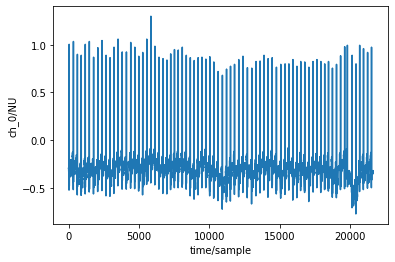

In [ ]:
ecg_val = wfdb.rdrecord('/content/drive/My Drive/mitdb/100', sampfrom= 108300, sampto= 129900, channels= [0])
ecg_val = ecg_val.p_signal[:,0]

wfdb.plot_items(ecg_val)
ecg_val = torch.FloatTensor(ecg_val).view(-1)

seq_length = train_window
train_data_loader = create_dataloader(ecg_train, seq_length, batch_size)
val_data_loader = create_dataloader(ecg_val, seq_length, batch_size)

In [ ]:
def train(net, train_data_loader, val_data_loader, epochs=20, batch_size=batch_size, lr=0.1, clip=5, print_every=10):
    net.train()
    
    opt = torch.optim.Adam(net.parameters(), lr=lr)
    criterion = nn.L1Loss()
    
    if(train_on_gpu):
        net.cuda()
    
    counter = 0
    for e in range(epochs):
        # initialize hidden state
        h = net.init_hidden(batch_size)
        
        for x, y in train_data_loader:
            counter += 1
            x = torch.unsqueeze(x, 2)

            inputs, targets = x, y
            
            if(train_on_gpu):
                inputs, targets = inputs.cuda(), targets.cuda()

            # Creating new variables for the hidden state, otherwise
            # we'd backprop through the entire training history
            h = tuple([each.data for each in h])

            # zero accumulated gradients
            net.zero_grad()
            
            # get the output from the model
            output, h = net(inputs, h)
            
            # calculate the loss and perform backprop
            loss = criterion(output, targets.view(batch_size).long())
            loss.backward()
            # `clip_grad_norm` helps prevent the exploding gradient problem in RNNs / LSTMs.
            nn.utils.clip_grad_norm_(net.parameters(), clip)
            opt.step()
            
            # loss stats
            if counter % print_every == 0:
                # Get validation loss
                val_h = net.init_hidden(batch_size)
                val_losses = []
                net.eval()
                for x, y in val_data_loader:
                    # Creating new variables for the hidden state, otherwise
                    # we'd backprop through the entire training history
                    val_h = tuple([each.data for each in val_h])

                    x = torch.unsqueeze(x, 2)

                    inputs, targets = x, y
                    if(train_on_gpu):
                        inputs, targets = inputs.cuda(), targets.cuda()

                    output, val_h = net(inputs, val_h)
                    val_loss = criterion(output, targets.view(batch_size).long())
                
                    val_losses.append(val_loss.item())
                
                net.train() # reset to train mode
                
                print("Epoch: {}/{}...".format(e+1, epochs),
                      "Step: {}...".format(counter),
                      "Loss: {:.4f}...".format(loss.item()),
                      "Val Loss: {:.4f}".format(np.mean(val_losses)))

In [ ]:
hidden_dim=32
n_layers=3

net = LSTM(hidden_dim= hidden_dim, n_layers= n_layers)
print(net)
train_on_gpu = torch.cuda.is_available()

LSTM(
  (lstm): LSTM(1, 32, num_layers=3, batch_first=True, dropout=0.5)
  (dropout): Dropout(p=0.5, inplace=False)
  (linear): Linear(in_features=32, out_features=1, bias=True)
)


In [ ]:
batch_size = 64
seq_length = train_window
n_epochs = 10

# model training
# train(net, ecg_train, epochs=n_epochs, batch_size=batch_size, seq_length=seq_length, lr=0.001, print_every=10)

train(net, train_data_loader, val_data_loader, epochs=n_epochs, batch_size=batch_size, lr=0.1, print_every=10)

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:93: UserWarning: Using a target size (torch.Size([64])) that is different to the input size (torch.Size([54400, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch: 1/10... Step: 10... Loss: 0.1070... Val Loss: 0.0861
Epoch: 1/10... Step: 20... Loss: 0.0304... Val Loss: 0.0238
Epoch: 1/10... Step: 30... Loss: 0.0047... Val Loss: 0.0073
Epoch: 1/10... Step: 40... Loss: 0.0178... Val Loss: 0.0249
Epoch: 1/10... Step: 50... Loss: 0.0440... Val Loss: 0.0475
Epoch: 1/10... Step: 60... Loss: 0.0077... Val Loss: 0.0082
Epoch: 1/10... Step: 70... Loss: 0.0028... Val Loss: 0.0046
Epoch: 1/10... Step: 80... Loss: 0.0085... Val Loss: 0.0079
Epoch: 1/10... Step: 90... Loss: 0.0157... Val Loss: 0.0204
Epoch: 1/10... Step: 100... Loss: 0.0101... Val Loss: 0.0043
Epoch: 1/10... Step: 110... Loss: 0.0094... Val Loss: 0.0078
Epoch: 1/10... Step: 120... Loss: 0.0112... Val Loss: 0.0161
Epoch: 1/10... Step: 130... Loss: 0.0119... Val Loss: 0.0063
Epoch: 1/10... Step: 140... Loss: 0.0071... Val Loss: 0.0099
Epoch: 1/10... Step: 150... Loss: 0.0093... Val Loss: 0.0142
Epoch: 1/10... Step: 160... Loss: 0.0130... Val Loss: 0.0071
Epoch: 1/10... Step: 170... Loss:

In [ ]:
model_name = 'rnn_20_epoch.net'

checkpoint_20E = {'n_hidden': net.hidden_dim,
              'n_layers': net.n_layers,
              'state_dict': net.state_dict()}

with open(model_name, 'wb') as f:
    torch.save(checkpoint_20E, f)

# **Using Images**

In [ ]:
!pip install wfdb
%matplotlib inline
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
import matplotlib.pyplot as plt
import wfdb
import os
from wfdb import processing
import numpy as np
import cv2

     |████████████████████████████████| 122kB 8.4MB/s 
     |████████████████████████████████| 6.8MB 7.1MB/s 
     |████████████████████████████████| 163kB 51.8MB/s 
  Created wheel for wfdb: filename=wfdb-3.1.1-cp36-none-any.whl size=117828 sha256=b6757bb858356708a1ce1d6adb4721e5da82f99d640c2094496cec86c486b572
  Stored in directory: /root/.cache/pip/wheels/bc/d0/c1/90538d266ccba2d1076fbc9970192c7ea1a09c99df3e65c69b
Successfully built wfdb


In [ ]:
record = wfdb.rdrecord('/content/drive/My Drive/mitdb/208', channels=[0])
annotation = wfdb.rdann('/content/drive/My Drive/mitdb/208','atr')
signal, fields = wfdb.rdsamp('/content/drive/My Drive/mitdb/208', channels=[0])

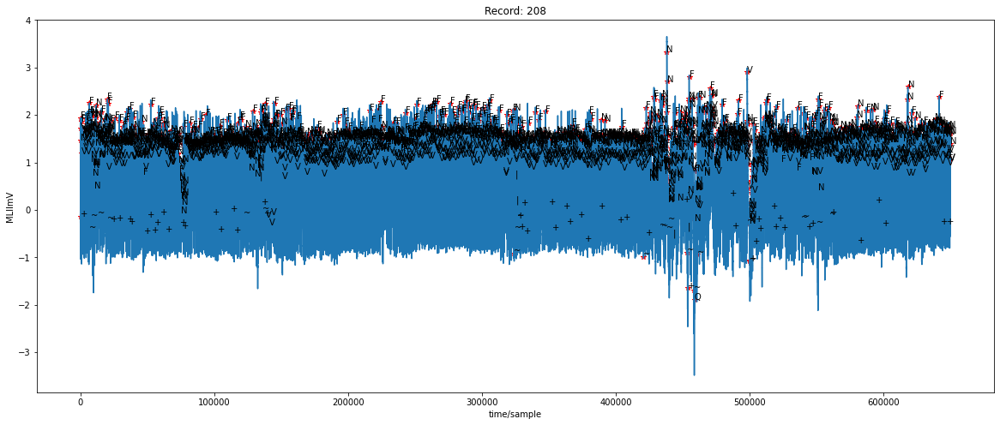

In [ ]:
wfdb.plot_wfdb(record=record, annotation=annotation, plot_sym=True, figsize=(20,8))

True

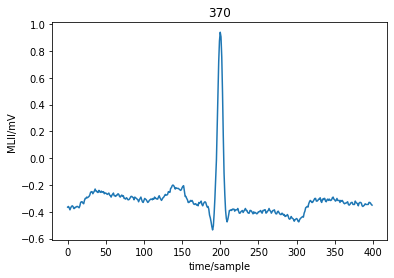

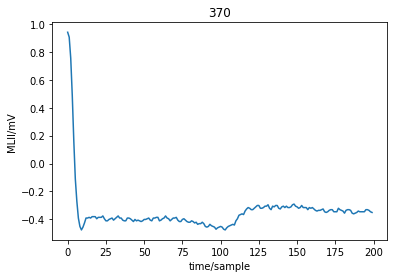

In [ ]:

figure=[]
record = wfdb.rdrecord('/content/drive/My Drive/mitdb/100', sampfrom=370-200, sampto=370+200, channels=[0])
figure.append(wfdb.plot_wfdb(record=record, title=370, return_fig=True))

record = wfdb.rdrecord('/content/drive/My Drive/mitdb/100', sampfrom=370, sampto=370+200, channels=[0])
figure.append(wfdb.plot_wfdb(record=record, title=370, return_fig=True))

figure[0].savefig('/content/drive/My Drive/report_pics/description_of_the_process' + "/" + 'full_plot' + ".png")
figure[1].savefig('/content/drive/My Drive/report_pics/description_of_the_process' + "/" + 'rt_plot' + ".png")

image = figure[1]

image.canvas.draw()

data = np.frombuffer(image.canvas.tostring_rgb(), dtype=np.uint8)

data = data.reshape((image.canvas.get_width_height()[::-1] + (3,)))

data = cv2.cvtColor(data, cv2.COLOR_RGB2BGR)

data = data[288-250:288-35, 55:390]

cv2.imwrite('/content/drive/My Drive/report_pics/description_of_the_process' + "/" + 'cropped_rt_plot' + ".png", data)

In [ ]:
annotation.__dict__

{'ann_len': 3040,
 'aux_note': ['(N\x00',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '(T\x00',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '(N\x00',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  ''

In [ ]:
record.__dict__

{'adc_gain': [200.0],
 'adc_res': [11],
 'adc_zero': [1024],
 'base_counter': None,
 'base_date': None,
 'base_time': None,
 'baseline': [1024],
 'block_size': [0],
 'byte_offset': [None],
 'checksum': [59892],
 'comments': ['69 M 1085 1629 x1', 'Aldomet, Inderal'],
 'counter_freq': None,
 'd_signal': None,
 'e_d_signal': None,
 'e_p_signal': None,
 'file_name': ['100.dat'],
 'fmt': ['212'],
 'fs': 360,
 'init_value': [1212],
 'n_sig': 1,
 'p_signal': array([[ 0.94 ],
        [ 0.905],
        [ 0.755],
        [ 0.49 ],
        [ 0.165],
        [-0.11 ],
        [-0.27 ],
        [-0.39 ],
        [-0.45 ],
        [-0.475],
        [-0.455],
        [-0.425],
        [-0.39 ],
        [-0.39 ],
        [-0.385],
        [-0.39 ],
        [-0.38 ],
        [-0.38 ],
        [-0.38 ],
        [-0.395],
        [-0.385],
        [-0.385],
        [-0.385],
        [-0.375],
        [-0.395],
        [-0.41 ],
        [-0.41 ],
        [-0.4  ],
        [-0.395],
        [-0.39 ],
     

In [ ]:
signal[:,0]

array([-0.105, -0.105, -0.105, ..., -0.17 , -0.16 ,  0.   ])

In [ ]:
fields

{'base_date': None,
 'base_time': None,
 'comments': ['23 F 2546 N/A x1',
  'None',
  'The PVCs are uniform.  The couplets, many of which include a fusion PVC, are',
  'often seen in a bigeminal pattern.   The triplets each consist of two',
  'PVCs and a fusion PVC.'],
 'fs': 360,
 'n_sig': 1,
 'sig_len': 650000,
 'sig_name': ['MLII'],
 'units': ['mV']}

QRS segment detection using 'wfdb'.

In [ ]:
rqrs = processing.xqrs_detect(record.p_signal[:,0], record.fs)

Learning initial signal parameters...
Failed to find 8 beats during learning.
Initializing using default parameters
Running QRS detection...
QRS detection complete.


In [ ]:
len(rqrs)

0


The record number is stored in 'data'. R-T intervals are plotted and stored in 'figure'.

100 - normal

118 - rbbb

217 - paced

106, 208, 233 - PVC

In [ ]:
recs = ["100", "118", "217","106","109"]

In [ ]:
dataset = {}
for rec_no in recs:
    data = "/content/drive/My Drive/mitdb/"+rec_no
    result_to = "/content/drive/My Drive/report_pics/images/"+rec_no
    record = wfdb.rdrecord(data, channels=[0])
    rqrs = processing.xqrs_detect(record.p_signal[:,0], record.fs)
    figure = []
    for i in range(100):
        start = rqrs[i]-200
        stop = rqrs[i]+200
        if start<0: 
            start=0
        temp_rec = wfdb.rdrecord(data, sampfrom=start,sampto=stop, channels=[0])
        figure.append(wfdb.plot_wfdb(record=temp_rec,  plot_sym=True, title=rqrs[i], return_fig=True))
        figure[-1].savefig(result_to + "/" + str(rqrs[i]) + ".png")
        plt.close()
    dataset[rec_no] = figure

Learning initial signal parameters...
Found 8 beats during learning. Initializing using learned parameters
Running QRS detection...
QRS detection complete.
Learning initial signal parameters...
Found 8 beats during learning. Initializing using learned parameters
Running QRS detection...
QRS detection complete.
Learning initial signal parameters...
Found 8 beats during learning. Initializing using learned parameters
Running QRS detection...
QRS detection complete.
Learning initial signal parameters...
Found 8 beats during learning. Initializing using learned parameters
Running QRS detection...
QRS detection complete.
Learning initial signal parameters...
Found 8 beats during learning. Initializing using learned parameters
Running QRS detection...
QRS detection complete.


In [ ]:
image = dataset["100"][0]

In [ ]:
image.canvas.draw()

In [ ]:
data = np.frombuffer(image.canvas.tostring_rgb(), dtype=np.uint8)

In [ ]:
data = data.reshape((image.canvas.get_width_height()[::-1] + (3,)))

In [ ]:
data.shape

(288, 432, 3)

In [ ]:
data = cv2.cvtColor(data, cv2.COLOR_RGB2BGR)

In [ ]:
data = data[288-250:288-35, 55:390]

In [ ]:
data = cv2.resize(data, (int(215/5), int(215/5)), cv2.INTER_LINEAR)

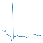

In [ ]:
from google.colab.patches import cv2_imshow
cv2_imshow(data)


In [ ]:
cv2.waitKey(0)
cv2.destroyAllWindows()


New Image Generation

106 - PVC

109 - LBBB

213 - Fusion of PVC and Normal


In [ ]:
record = wfdb.rdrecord('/content/drive/My Drive/mitdb/111', channels=[0])
annotation = wfdb.rdann('/content/drive/My Drive/mitdb/111','atr')

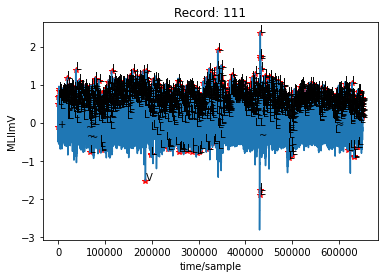

In [ ]:
wfdb.plot_wfdb(record=record, annotation=annotation, plot_sym=True)

In [ ]:
recs = ["100", "118", "217","106","109"]
label='L'

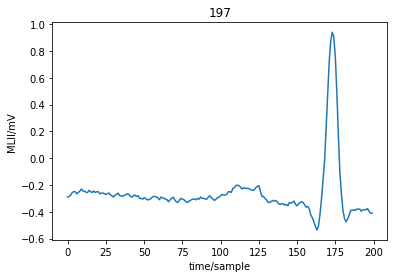

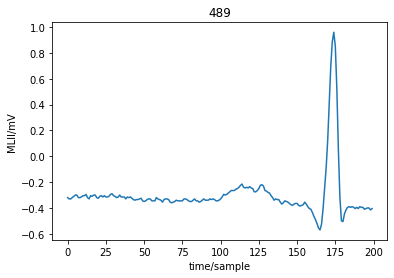

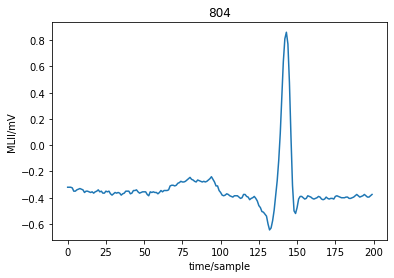

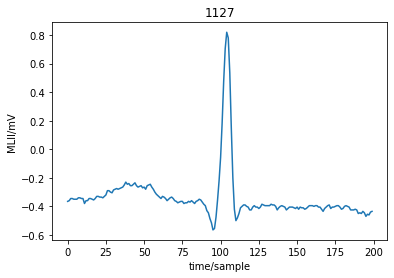

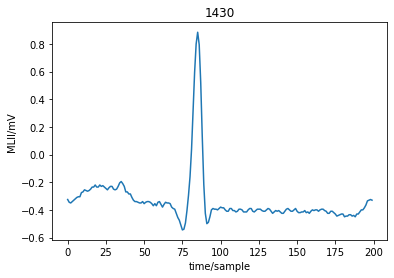

...

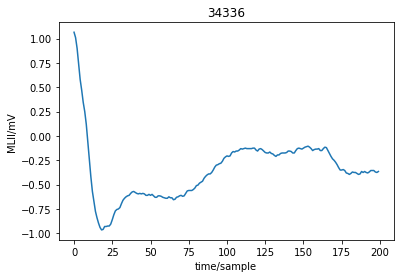

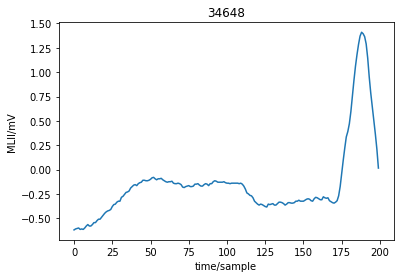

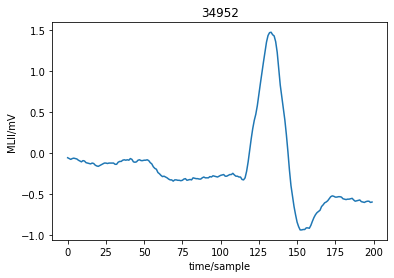

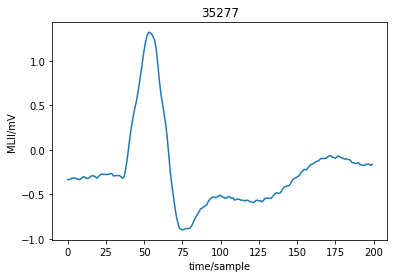

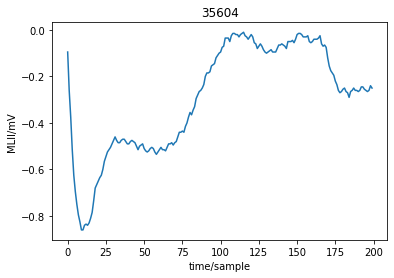

In [ ]:
dataset = {}
for rec_no in recs:
    data = "/content/drive/My Drive/mitdb/"+rec_no
    result_to = "/content/drive/My Drive/report_pics/images-half/"+rec_no
    figure = []
    for i in range(115):
        if annotation.symbol[i] == label:
            start = annotation.sample[i]
            stop = annotation.sample[i]+200
            if start<0: 
                start=0
            temp_rec = wfdb.rdrecord(data, sampfrom=start,sampto=stop, channels=[0])
            figure.append(wfdb.plot_wfdb(record=temp_rec, plot_sym=True, title=annotation.sample[i], return_fig=True))
            figure[-1].savefig(result_to + "/" + str(annotation.sample[i]) + ".png")
            plt.show()
            plt.close()
    dataset[rec_no] = figure

Model 1

In [ ]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
import os, glob, cv2
import numpy as np
from sklearn.metrics import confusion_matrix
import tensorflow as tf
import matplotlib.pyplot as plt
from keras.models import Sequential
from keras.layers import Dense, Conv2D, MaxPooling2D, Flatten, Dropout, BatchNormalization, Activation
from keras.optimizers import Adam

In [ ]:
train_path = '/content/drive/My Drive/report_pics/images-half/'
classes = ["100", "106", "109", "118", "217"]

In [ ]:
def load_data_cnn(train_path):
    images = []
    labels = []
    classes = [lists for lists in os.walk(train_path)][0][1]    
    for cls in classes:
        file_path = os.path.join(train_path, cls, "*g")
        for file in glob.glob(file_path):
            image = cv2.imread(file)
            image = cv2.resize(image, (432, 288), cv2.INTER_LINEAR)
            image = image[288-250:288-35, 55:390]
            image = cv2.resize(image, (int(215/5), int(215/5)), cv2.INTER_LINEAR)
            label = np.zeros(len(classes))
            label[classes.index(cls)] = 1.0
            images.append(image)
            labels.append(label) 
    images = np.array(images)
    labels = np.array(labels)
    return images, labels

dataset = load_data_cnn(train_path)

In [ ]:
X_train = []
X_train.append(dataset[0][:80])
X_train.append(dataset[0][100:180])
X_train.append(dataset[0][200:280])
X_train.append(dataset[0][300:380])
X_train.append(dataset[0][400:480])
X_train = [j for i in X_train for j in i]
X_train = np.array(X_train)

y_train = []
y_train.append(dataset[1][:80])
y_train.append(dataset[1][100:180])
y_train.append(dataset[1][200:280])
y_train.append(dataset[1][300:380])
y_train.append(dataset[1][400:480])
y_train = [j for i in y_train for j in i]
y_train = np.array(y_train)

X_test = []
X_test.append(dataset[0][80:100])
X_test.append(dataset[0][180:200])
X_test.append(dataset[0][280:300])
X_test.append(dataset[0][380:400])
X_test.append(dataset[0][480:500])
X_test = [j for i in X_test for j in i]
X_test = np.array(X_test)

y_test = []
y_test.append(dataset[1][80:100])
y_test.append(dataset[1][180:200])
y_test.append(dataset[1][280:300])
y_test.append(dataset[1][380:400])
y_test.append(dataset[1][480:500])
y_test = [j for i in y_test for j in i]
y_test = np.array(y_test)

y_test_label = []
for i in range(100):
    if i >= 80:
        y_test_label.append(4)
    elif i >= 60:
        y_test_label.append(3)
    elif i >= 40:
        y_test_label.append(2)
    elif i >= 20:
        y_test_label.append(1)
    else:
        y_test_label.append(0)

In [ ]:
input_shape = (int(215/5), int(215/5), 3)

In [ ]:
cnn_model = Sequential()

cnn_model.add(Conv2D(64, (3, 3), input_shape=input_shape, activation='relu'))
cnn_model.add(Conv2D(64, (3, 3), activation='relu'))
cnn_model.add(MaxPooling2D(pool_size=(2, 2)))
cnn_model.add(Dropout(0.25))

cnn_model.add(Conv2D(32, (3, 3), padding='same', activation='relu'))
cnn_model.add(Conv2D(32, (3, 3), activation='relu'))
cnn_model.add(MaxPooling2D(pool_size=(2, 2)))
cnn_model.add(Dropout(0.25))

cnn_model.add(Conv2D(32, (3, 3), padding='same', activation='relu'))
cnn_model.add(Conv2D(32, (3, 3), activation='relu'))
cnn_model.add(MaxPooling2D(pool_size=(2, 2)))
cnn_model.add(Dropout(0.25))

cnn_model.add(Flatten())
cnn_model.add(Dense(256, activation='relu'))
cnn_model.add(Dropout(0.5))
cnn_model.add(Dense(5, activation='softmax'))

In [ ]:
cnn_model.compile(optimizer=Adam(lr=0.0001, beta_1=0.9, beta_2=0.999), loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
cnn_model.fit(X_train, y_train, validation_split=0.1, epochs=100, batch_size=9, shuffle=True)

Epoch 1/100
40/40 [==============================] - 0s 8ms/step - loss: 18.3040 - accuracy: 0.1972 - val_loss: 1.5715 - val_accuracy: 0.3750
Epoch 2/100
40/40 [==============================] - 0s 4ms/step - loss: 4.9145 - accuracy: 0.2222 - val_loss: 2.0469 - val_accuracy: 0.1250
Epoch 3/100
40/40 [==============================] - 0s 5ms/step - loss: 2.7087 - accuracy: 0.2583 - val_loss: 1.8284 - val_accuracy: 0.2500
Epoch 4/100
40/40 [==============================] - 0s 4ms/step - loss: 2.2087 - accuracy: 0.2444 - val_loss: 2.2245 - val_accuracy: 0.0000e+00
Epoch 5/100
40/40 [==============================] - 0s 4ms/step - loss: 1.7030 - accuracy: 0.2611 - val_loss: 1.7933 - val_accuracy: 0.1250
Epoch 6/100
40/40 [==============================] - 0s 4ms/step - loss: 1.6481 - accuracy: 0.2750 - val_loss: 1.8522 - val_accuracy: 0.0500
Epoch 7/100
40/40 [==============================] - 0s 4ms/step - loss: 1.5615 - accuracy: 0.3222 - val_loss: 2.0500 - val_accuracy: 0.0000e+00
Epoc

In [ ]:

loss, accuracy = cnn_model.evaluate(X_test, y_test)
print("Loss = "+str(loss))
print("Accuracy = "+str(accuracy))

4/4 [==============================] - 0s 2ms/step - loss: 2.2421 - accuracy: 0.7200
Loss = 2.2421483993530273
Accuracy = 0.7200000286102295


In [ ]:
predictions = cnn_model.predict_classes(X_test, batch_size=5)

Instructions for updating:
Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).


Model 2

In [ ]:

cnn_model = Sequential()

cnn_model.add(Conv2D(64, (3, 3), input_shape=input_shape))
cnn_model.add(BatchNormalization())
cnn_model.add(Activation('relu'))
cnn_model.add(MaxPooling2D(pool_size=(2, 2)))
cnn_model.add(Dropout(0.25))

cnn_model.add(Conv2D(32, (3, 3)))
cnn_model.add(BatchNormalization())
cnn_model.add(Activation('relu'))
cnn_model.add(MaxPooling2D(pool_size=(2, 2)))
cnn_model.add(Dropout(0.25))

cnn_model.add(Conv2D(32, (3, 3)))
cnn_model.add(BatchNormalization())
cnn_model.add(Activation('relu'))
cnn_model.add(MaxPooling2D(pool_size=(2, 2)))
cnn_model.add(Dropout(0.25))

cnn_model.add(Flatten())
cnn_model.add(Dense(256, activation='relu'))
cnn_model.add(Dropout(0.5))
cnn_model.add(Dense(5, activation='softmax'))

In [ ]:
cnn_model.compile(optimizer=Adam(lr=0.0001, beta_1=0.9, beta_2=0.999), loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
classifier = cnn_model.fit(X_train, y_train, validation_split=0.1, epochs=50, batch_size=9, shuffle=True)

Epoch 1/50
40/40 [==============================] - 0s 8ms/step - loss: 2.0277 - accuracy: 0.2889 - val_loss: 5.6694 - val_accuracy: 0.2750
Epoch 2/50
40/40 [==============================] - 0s 4ms/step - loss: 1.7454 - accuracy: 0.3472 - val_loss: 4.3358 - val_accuracy: 0.3750
Epoch 3/50
40/40 [==============================] - 0s 4ms/step - loss: 1.7175 - accuracy: 0.3722 - val_loss: 3.3505 - val_accuracy: 0.3750
Epoch 4/50
40/40 [==============================] - 0s 3ms/step - loss: 1.5298 - accuracy: 0.3861 - val_loss: 2.8809 - val_accuracy: 0.3750
Epoch 5/50
40/40 [==============================] - 0s 4ms/step - loss: 1.5077 - accuracy: 0.3917 - val_loss: 2.7067 - val_accuracy: 0.3750
Epoch 6/50
40/40 [==============================] - 0s 3ms/step - loss: 1.4417 - accuracy: 0.4278 - val_loss: 2.6324 - val_accuracy: 0.3500
Epoch 7/50
40/40 [==============================] - 0s 4ms/step - loss: 1.3454 - accuracy: 0.4556 - val_loss: 2.5730 - val_accuracy: 0.3250
Epoch 8/50
40/40 [==

In [ ]:
loss, accuracy = cnn_model.evaluate(X_test, y_test)
print("Loss = "+str(loss))
print("Accuracy = "+str(accuracy))

4/4 [==============================] - 0s 3ms/step - loss: 1.8791 - accuracy: 0.6700
Loss = 1.879081130027771
Accuracy = 0.6700000166893005


In [ ]:
cnn_model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_11 (Conv2D)           (None, 41, 41, 64)        1792      
_________________________________________________________________
batch_normalization_5 (Batch (None, 41, 41, 64)        256       
_________________________________________________________________
activation (Activation)      (None, 41, 41, 64)        0         
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 20, 20, 64)        0         
_________________________________________________________________
dropout_8 (Dropout)          (None, 20, 20, 64)        0         
_________________________________________________________________
conv2d_12 (Conv2D)           (None, 18, 18, 32)        18464     
_________________________________________________________________
batch_normalization_6 (Batch (None, 18, 18, 32)       